In [12]:
import torch
import torchvision.models as models
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
import os
import cv2
import json
import math
import torch
import random
import numpy as np
from PIL import Image
from tqdm import tqdm
import torch.nn as nn
import tensorflow as tf
import torch.optim as optim
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from torchvision import transforms
import torchvision
import torchvision.transforms.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import fasterrcnn_resnet50_fpn, fasterrcnn_resnet50_fpn_v2

# Define the model architecture (e.g., Faster R-CNN with ResNet-50 backbone)
model = models.detection.fasterrcnn_resnet50_fpn(num_classes = 3, pretrained=False)

In [13]:
class CustomBackbone(nn.Module):
    def __init__(self):
        super(CustomBackbone, self).__init__()
        # Define your custom backbone layers here
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.layer3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        return x

def get_model(num_classes, pretrained):

    backbone = CustomBackbone()
    backbone.out_channels = 256  # This should match the output channels of your custom backbone
    
    # RPN (Region Proposal Network)
    rpn_anchor_generator = AnchorGenerator(
        sizes=((32, 64, 128, 256, 512),),
        aspect_ratios=((0.5, 1.0, 2.0),)
    )
    
    # ROI Pooling
    roi_pooler = torchvision.ops.MultiScaleRoIAlign(
        featmap_names=['0'], output_size=7, sampling_ratio=2
    )
    
    model = FasterRCNN(
        backbone,
        num_classes=num_classes,
        rpn_anchor_generator=rpn_anchor_generator,
        box_roi_pool=roi_pooler
    )
    
    return model

In [14]:
checkpoint_path = '../model_this/custom_backbone_60_from_scratch.pth'
checkpoint = torch.load(checkpoint_path)
num_classes = 3
model = get_model(num_classes, pretrained = True)
# Load the model state dictionary
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): CustomBackbone(
    (layer1): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (layer2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (layer3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (rpn): RegionProposalNetwork(
    (anchor_generator): AnchorGenerator()
    (head): RPNHead(
    

In [15]:
device = torch.device("cpu")
print(f"Using device: {device}")

Using device: cpu


In [16]:
test_img_path = '../../data/coco/test'
test_label_file = '../../data/coco/test/_annotations.coco.json'
valid_img_path = '../../data/coco/valid'
valid_label_file = '../../data/coco/valid/_annotations.coco.json'


In [17]:
with open(test_label_file) as json_file:
    test_data_dict = json.load(json_file)
with open(valid_label_file) as json_file:
    valid_data_dict = json.load(json_file)

In [18]:
cat_mapping = dict() # Variable that maps class id -> class name
for category in test_data_dict['categories']:
    cat_mapping[category['id']] = category['name']

In [19]:
class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, bboxes):

        for t in self.transforms:
            image, bboxes = t(image, bboxes)
        return image, bboxes

    
class RandomHorizontalFlip(object):
    def __init__(self, p=0.5):

        self.p = p

    def __call__(self, image, bboxes):

        if random.random() < self.p:
            image = F.hflip(image)
            width, _ = image.size
            if len(bboxes)!=0:
                bboxes = bboxes.clone()
                bboxes[:, [0, 2]] = width - bboxes[:, [2, 0]]  # Flip x_min and x_max
        return image, bboxes

    
class ToTensor(object):
    def __call__(self, image, bboxes):

        image = F.to_tensor(image)
        return image, bboxes

In [20]:
train_transform = Compose([
            RandomHorizontalFlip(p=0.5),
            ToTensor()
        ])

val_transform = Compose([
            ToTensor()
        ])

test_transform = val_transform

In [21]:
class CSGODataset(Dataset):
    def __init__(self, img_path, data_dict, transform=None):
        self.img_path = img_path
        self.data_dict = data_dict
        self.transform = transform
        self.dataset = self.create_dataset()
    
    def create_dataset(self):

        dataset = []
        for element in self.data_dict["images"]:
            img_id = element['id']
            img_annotations = []
            for annotation in self.data_dict['annotations']:
                if annotation['image_id'] == img_id:
                    img_annotations.append(annotation)
            dataset.append([element['file_name'], img_annotations])
        
        return dataset
    
    def __len__(self):

        return len(self.data_dict['images'])
    
    def collate_fn(self, batch):

        images = list()
        boxes = list()
        labels = list()
        areas = list()
        image_id = list()

        for b in batch:
            images.append(b[0])
            boxes.append(b[1])
            labels.append(b[2])
            areas.append(b[3])
            image_id.append(b[4])

        images = torch.stack(images, dim=0)

        return images, boxes, labels, areas, image_id
    
    def __getitem__(self, idx):

        img = cv2.imread(os.path.join(self.img_path, self.dataset[idx][0]))
        #img = img.reshape().astype(np.uint8)
            
        cat_ids = []
        bbs = []
        areas = []
        iscrowd = []
        image_id = []
        for annotation in self.dataset[idx][1]:
            cat_ids.append(annotation['category_id'])
            bbs.append(annotation['bbox'])
            areas.append(annotation['area'])
            iscrowd.append(annotation['iscrowd'])
            image_id.append(annotation['image_id'])
        cat_ids = torch.Tensor(cat_ids)
        
        areas = torch.Tensor(areas)
        iscrowd = torch.Tensor(iscrowd)
        image_id = torch.Tensor(image_id)
        
        bbs = np.array(bbs)
        for i, bb in enumerate(bbs):
            x_min, y_min, width, height = bb
            x1, y1 = x_min, y_min
            x2, y2 = x_min + width, y_min + height
            bbs[i] = np.array([x1, y1, x2, y2])
        
        bbs = torch.Tensor(bbs)
        if self.transform:
            img = Image.fromarray(img)
            img, bbs = self.transform(img, bbs)
        
        bbs = torch.from_numpy(np.array(bbs))
        cat_ids = torch.Tensor(cat_ids).long()
        
        return img, bbs, cat_ids, areas, image_id

In [22]:
test_dataset = CSGODataset(test_img_path, test_data_dict, transform=test_transform)
test_dataloader = DataLoader(test_dataset, batch_size=cfg.test_batch_size, shuffle=False, collate_fn=test_dataset.collate_fn)
valid_dataset = CSGODataset(valid_img_path, valid_data_dict, transform=test_transform)
valid_dataloader = DataLoader(valid_dataset, batch_size=cfg.test_batch_size, shuffle=False, collate_fn=valid_dataset.collate_fn)


NameError: name 'cfg' is not defined

In [ ]:
def calculate_iou(box1, box2):

    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    inter_area = max(0, inter_max_x - inter_min_x) * max(0, inter_max_y - inter_min_y)

    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    iou = inter_area / float(box1_area + box2_area - inter_area)
    return iou

In [ ]:
def plot_test_predictions(image, boxes, labels, scores, class_names, true_boxes, true_labels, image_id, iou_threshold=0.7):
    image = image.permute(1, 2, 0).numpy()
    image = (image * 255).astype(np.uint8) # Convert back to [0, 255] range
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    correct = 0.0
    bbox_correct = 0.0
    class_correct = 0.0
    total = 0.0
    for box, label, score in zip(boxes, labels, scores): # For each bounding box and label found in the image
        x1, y1, x2, y2 = map(int, box)
        match = False
        match_bb = False
        total += 1
        for true_box, true_label in zip(true_boxes, true_labels):
            if calculate_iou(box, true_box) >= iou_threshold and label == true_label: # Bounding Box and class right
                match = True
            elif calculate_iou(box, true_box) >= iou_threshold: # Bounding Box right but class wrong
                match_bb = True
        
        text = f'{class_names[int(label)]}: {score:.2f}'
        if match:
            green = (0, 255, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=green, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=green, thickness=2)
            correct += 1
            bbox_correct += 1
            class_correct += 1
        elif match_bb:
            blue = (0, 0, 255)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=blue, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=blue, thickness=2)
            correct += .5
            bbox_correct += 1
        else:
            red = (255, 0, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=red, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=red, thickness=2)
    plt.title(f'Image {int(image_id[0])}')
    plt.imshow(image)
    plt.axis('off')
    plt.show()

  

In [ ]:
def get_Predictions(dataloader):
    i = 0
    for images, bbs, labels, areas, image_id in dataloader:
        
        images = images.float().to(device)
        if(i !=0  and len(image_id) > 0):
            with torch.no_grad():
                prediction = model(images)
                
            pred_boxes = prediction[0]['boxes'].cpu().numpy()
            true_boxes = bbs[0].numpy()
            pred_labels = prediction[0]['labels'].cpu().numpy()
            true_labels = labels[0].numpy()
            pred_scores = prediction[0]['scores'].cpu().numpy()
            pred_boxes = pred_boxes[pred_scores >= 0.11].tolist()
            pred_labels = pred_labels[pred_scores >= 0.11].tolist()
            pred_scores = pred_scores[pred_scores >= 0.11].tolist()

            images = images.cpu().detach()
    
            plot_test_predictions(images[0], pred_boxes, pred_labels, pred_scores, cat_mapping, true_boxes, true_labels, image_id[0])
        i = i + 1

In [ ]:
import torch
print(torch.__version__)

2.3.1+cu121


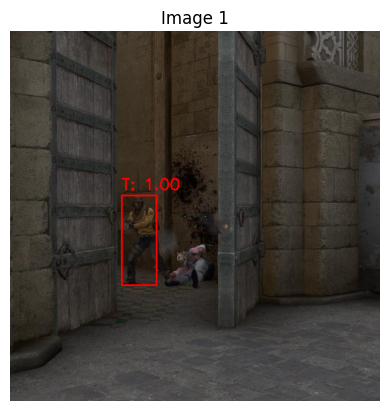

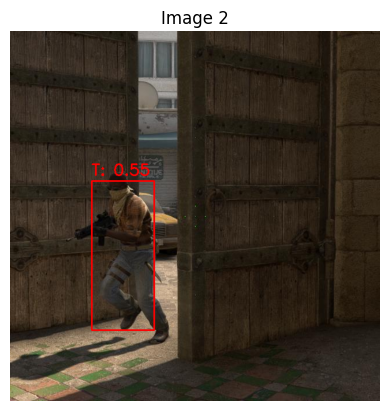

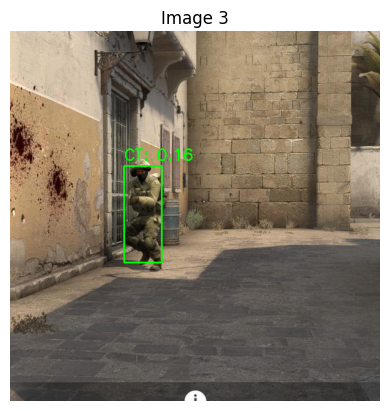

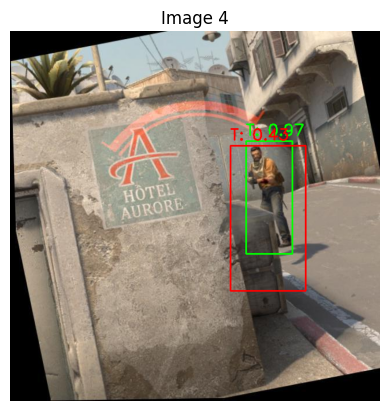

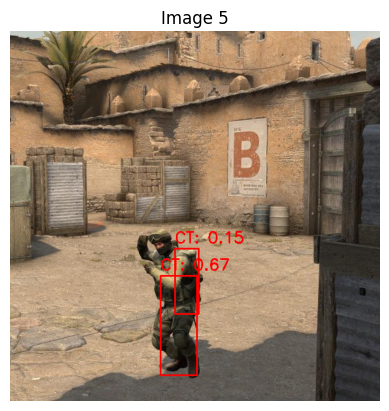

...

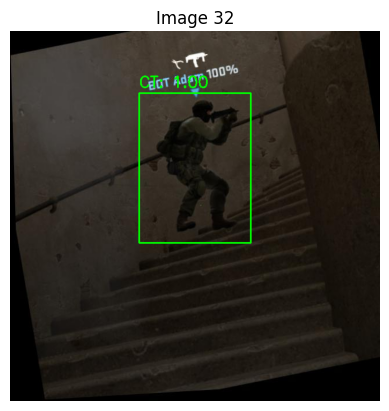

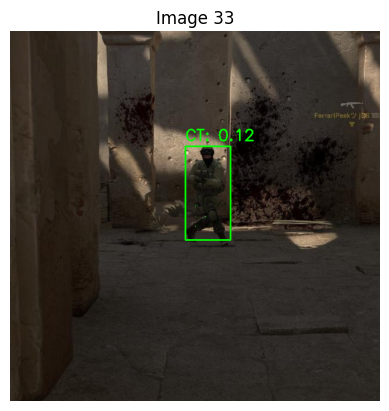

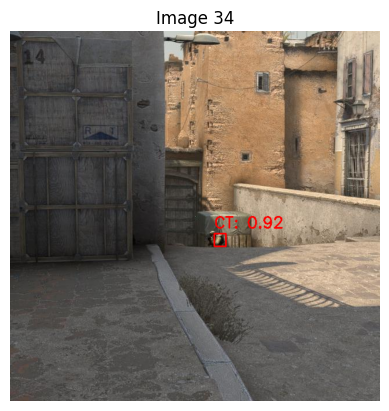

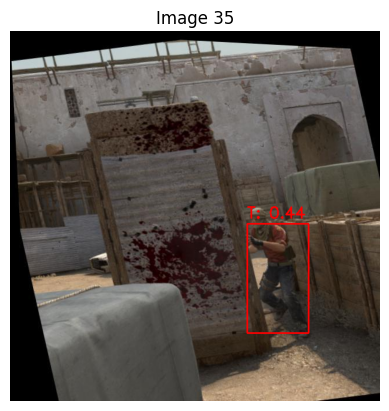

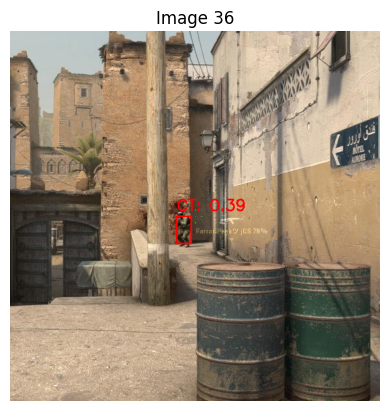

In [ ]:
get_Predictions(test_dataloader)

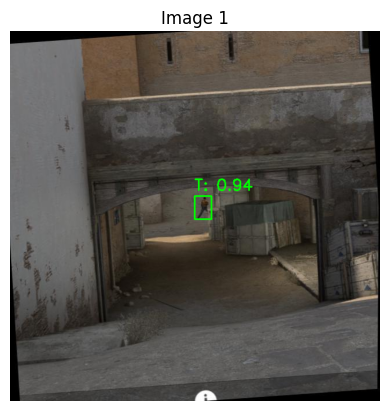

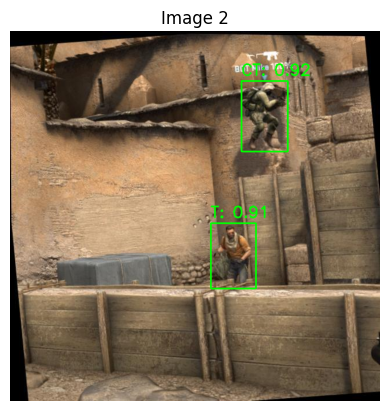

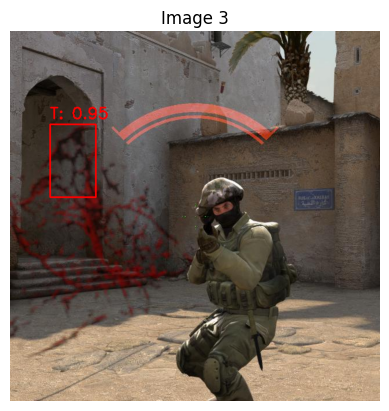

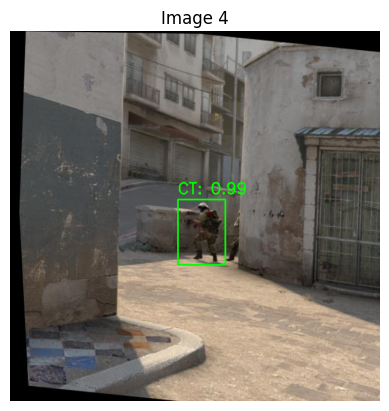

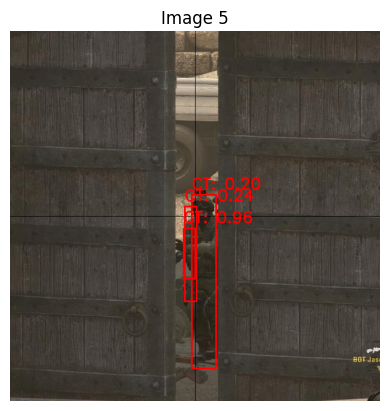

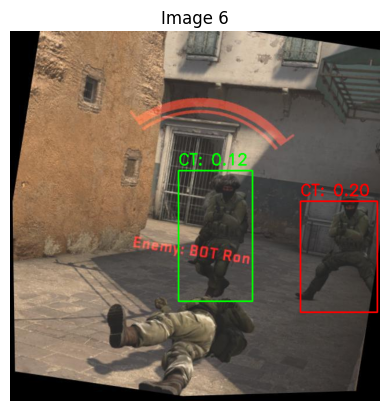

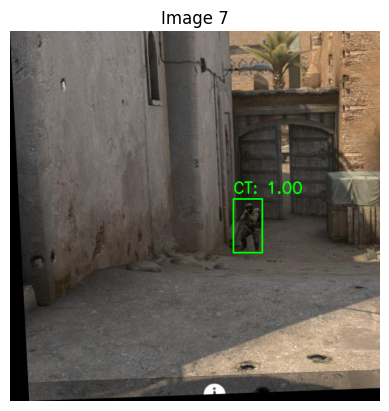

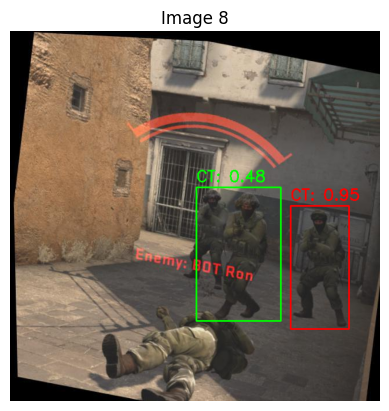

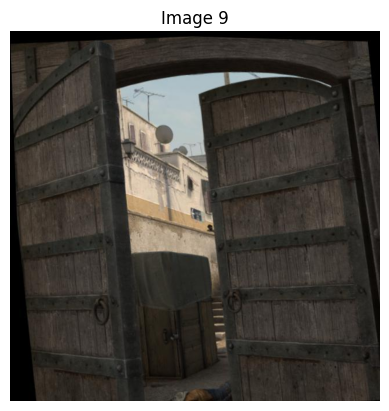

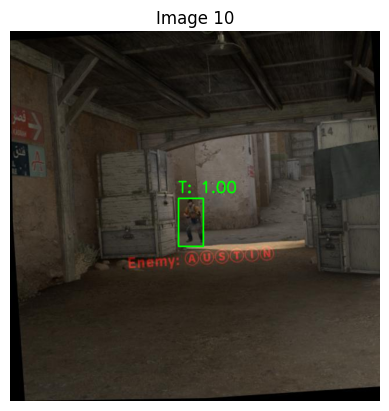

IndexError: index 0 is out of bounds for dimension 0 with size 0

In [ ]:
get_Predictions(valid_dataloader)